# Install dependacies and import libraries

Firstly we will need to install a few things, namely pytorch! Each time you run the notebook you'll need to reinstall.

In [1]:
# Url management.
import io
from six.moves.urllib.request import urlopen

# For teacher forcing.
import random

# Audio libraries.
import IPython
import librosa
import librosa.display

# A very useful numerical package.
import numpy as np

# NumPy on steriods.
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch import optim
from torch.autograd import Variable

# Stats for outlier detection.
from scipy import stats
from sklearn import svm
from sklearn import decomposition
from sklearn.neighbors import LocalOutlierFactor

# To make nice plots.
import matplotlib.font_manager
import matplotlib.pyplot as plt

In [2]:
def to_var(x):
    if torch.cuda.is_available():
        x = x.cuda()
    return Variable(x)

# Build models

Now we build the generator and discriminator

In [3]:
class EncoderRNN(nn.Module):
  
    """The encoder takes a batch of FFT frame sequences and returns encodings.

    There are no embeddings as the inputs are already real values, and the
    objective is to take FFT frames sequences (batch_size, sequence_length,
    fft_size) and return the encodings (batch_size, sequence_length, hidden_size).
    """
  
    def __init__(self, 
               input_size, 
               batch_size,
               hidden_size, 
               number_layers=1, 
               dropout=0.1,
               bi_directional=True,
               rnn=nn.GRU):

        """The __init__ function.

        Sets up the encoder with the specified amount of layers and hidden size.
        Uses a different mask for each timestep, which has been shown to perform
        worse than if the mask was the same, for diffent layers at different
        timesteps as in https://arxiv.org/abs/1512.05287. So be wary of this! To
        entirely cancel out the dropout, just set dropout to zero.

        Arguments:
          input_size: Size of the input FFT frames.
          hidden_size: Size of the hidden learnable weights for the RNN.
          number_layers: How many layers the encoding RNN should have.
          dropout: Zero for no dropout, one for complete dropout.
          bi_directional: Whether or not the RNN should run in two directions.
          rnn_type: Pass a RNN module here such as nn.GRU or nn.LSTM.
        """

        super(EncoderRNN, self).__init__()

        self.input_size = input_size
        self.batch_size = batch_size
        self.hidden_size = hidden_size
        self.number_layers = number_layers
        self.dropout = dropout
        self.bi_directional = bi_directional
        self.rnn = rnn(input_size=input_size,
                       hidden_size=hidden_size,
                       num_layers=number_layers, 
                       bidirectional=bi_directional,
                       batch_first=True)
    
    
    def forward(self, x, hidden):
        """The forward propoagation function. 

        The 
        """

        x, hidden = self.rnn(x, hidden)

        # linearly sum bi-directional outputs if appropriate.
        if self.bi_directional:
            forward = x[:, :, :self.hidden_size]
            backward = x[:, : ,self.hidden_size:]
            x = forward + backward

        return x, hidden
  
  
    def init_hidden(self):
        """"""
        amount = 2 if self.bi_directional else 1
        tensor = torch.FloatTensor(self.number_layers * amount, 
                                   self.batch_size, 
                                   self.hidden_size)
        return to_var(tensor.fill_(0))

  
  
class Attention(nn.Module):
  
    """An attention module that can switch between different scoring methods.

    The general form of the attention calculation uses the target decoder hidden
    state and the encoder state.

    Find the scoring methods here: https://arxiv.org/abs/1508.04025. The options
    are; 'dot', a dot product between the decoder and encoder state; 'general', 
    the dot product between the decoder state and a linear transform of the
    encoder state; 'concat', a dot product between a new parameter 'v' and a 
    linear transform of the states concatenated together. Finally the result is
    normalised.
    """

    def __init__(self, method, batch_size, hidden_size, bias=True):
        super(Attention, self).__init__()

        self.method = method
        self.batch_size = batch_size
        self.hidden_size = hidden_size

        if self.method == 'general':
            self.attention = nn.Linear(hidden_size, hidden_size, bias=bias)

        elif self.method == 'concat':
            self.attention = nn.Linear(hidden_size * 2, hidden_size, bias=bias)
            self.v = nn.Parameter(torch.FloatTensor(batch_size, 1, hidden_size))


    def forward(self, hidden, encoder_outputs):
        max_length = encoder_outputs.size(1)

        if self.method == 'general':
            attention_energies = self.attention(encoder_outputs).transpose(2, 1)
            attention_energies = hidden.bmm(attention_energies)

        elif self.method == 'concat':
            # Broadcast hidden to encoder_outputs size.
            hidden *= to_var(encoder_outputs.data.new(encoder_outputs.size()).fill_(1))
            concat = torch.cat((hidden, encoder_outputs), -1)
            attention_energies = self.attention(concat)

            # Swap the second and first dimensions. 
            attention_energies = attention_energies.transpose(2, 1)
            attention_energies = self.v.bmm(attention_energies)

        else:
            # Method is 'dot'.
            encoder_outputs = encoder_outputs.transpose(2, 1)
            attention_energies = hidden.bmm(encoder_outputs)

        return F.softmax(attention_energies)



    def score(self, hidden, encoder_output):

        if self.method == 'dot':
            energy = hidden.dot(encoder_output)

        elif self.method == 'general':
            energy = self.attention(encoder_output)
            energy = hidden.dot(encoder_output)

        elif self.method == 'concat':
            concat = torch.cat((hidden, encoder_output), 1)
            energy = self.attention(concat)
            energy = self.v.dot(energy)

        return energy
      
        

class AttentionDecoderRNN(nn.Module):
  
    """Luong Attention Decoder RNN module.

    This decoder plugs in the Attention module ater the RNN to calculate the """

    def __init__(self, 
                 attention_method,
                 batch_size,
                 hidden_size, 
                 output_size, 
                 number_layers=1, 
                 dropout=0.1):

        super(AttentionDecoderRNN, self).__init__()

        self.attention_method = attention_method
        self.batch_size = batch_size
        self.hidden_size = hidden_size
        self.output_size = output_size
        self.number_layers = number_layers
        self.dropout = dropout

        self.rnn = nn.GRU(hidden_size, 
                          hidden_size, 
                          number_layers, 
                          dropout=dropout, 
                          batch_first=True)

        self.concat = nn.Linear(hidden_size * 2, hidden_size)
        self.output = nn.Linear(hidden_size, output_size)

        self.attention = Attention(attention_method, batch_size, hidden_size)


    def forward(self, input_sequence, last_hidden, encoder_outputs):

        # Get current hidden state from input sequence and last hidden state.
        rnn_output, hidden = self.rnn(input_sequence, last_hidden)

        # Calculate attention from the current RNN state and all encoder outputs.
        attention_weights = self.attention(rnn_output, encoder_outputs)

        # bmm = batch matrix matrix product. Apply attention to encoder outputs to
        # get the weighted average.
        context = attention_weights.bmm(encoder_outputs)

        # Attentional vector using the RNN hidden state and context vector
        # concatenated together (Luong eq. 5).
        concat_input = torch.cat((rnn_output, context), -1)
        concat_output = F.tanh(self.concat(concat_input))

        # Finally predict next frame (Luong eq. 6, without softmax).
        output = self.output(concat_output)

        # Return final output, hidden state, and attention weights. We can use the
        # attention weights for visualisation.
        return output, hidden, attention_weights

# Test the encoder and decoder

In [4]:
if True:
    test_hidden_size     = 32
    test_input_size      = 32
    test_number_layers   = 3
    test_batch_size      = 16
    test_sequence_length = 7

    encoder_test = EncoderRNN(input_size=test_input_size,
                              batch_size=test_batch_size,
                              hidden_size=test_hidden_size,
                              number_layers=test_number_layers)

    decoder_test = AttentionDecoderRNN(attention_method='general',
                                       batch_size=test_batch_size,
                                       hidden_size=test_hidden_size,
                                       output_size=test_input_size,
                                       number_layers=test_number_layers)

    if torch.cuda.is_available():
        encoder_test.cuda()
        decoder_test.cuda()

    test_input_batches = to_var(torch.zeros(test_batch_size,
                                            test_sequence_length, 
                                            test_input_size))
    test_target_batches = to_var(torch.zeros(test_batch_size,
                                             test_sequence_length, 
                                             test_input_size))

    test_encoder_hidden = encoder_test.init_hidden()
    test_encoder_outputs, test_encoder_hidden = encoder_test(test_input_batches, 
                                                           test_encoder_hidden)

    # (batch_size, sequence_length, hidden_size)
    print('encoder outputs size      {}'.format(tuple(test_encoder_outputs.size())))

    # (number_layers * num_directions, sequence_length, hidden_size)
    print('encoder hidden state size {}'.format(tuple(test_encoder_hidden.size())))

    test_decoder_input = to_var(torch.zeros(test_batch_size, 
                                            test_sequence_length, 
                                            test_hidden_size))
    test_decoder_hidden = test_encoder_hidden[:decoder_test.number_layers]


    test_decoder_output, test_decoder_hidden, test_decoder_attention = \
        decoder_test(test_decoder_input, test_decoder_hidden, test_encoder_outputs)

    test_criterion = nn.MSELoss()
    test_loss = test_criterion(test_decoder_output, test_target_batches)
    print(test_loss.data[0])

encoder outputs size      (16, 7, 32)
encoder hidden state size (6, 16, 32)
0.009949877858161926


/home/eavi/leon/leon/lib/python3.5/site-packages/ipykernel_launcher.py:130: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.


# Utilites

You can look for music urls [here](https://www.jewelbeat.com/free/free-background-music.htm)

In [5]:
class A2BDataset():
    """A class to convert audio found at an url to magnitude frames."""

    def __init__(self,
                 path_a,
                 path_b,
                 fft_size,
                 hop_length,
                 batch_size,
                 sequence_length,
                 limit=None):

        self.fft_size = fft_size
        self.feature_size = (fft_size // 2) + 1
        self.hop_length = hop_length

        # Get data.
        self.sample_rate = 44100
        self.data_a, sr_a = librosa.load(path_a, mono=True, sr=self.sample_rate)
        self.data_b, sr_b = librosa.load(path_b, mono=True, sr=self.sample_rate)
        assert sr_a == sr_b, "Resampling was incorrect. Investigate."

        # Trim if necessary.
        if limit is not None:
            self.data_a = self.data_a[:limit * self.sample_rate]
            self.data_b = self.data_b[:limit * self.sample_rate]
            
        # Limit track a if a is longer than track b.
        elif len(self.data_a) > len(self.data_b):
            self.data_a = self.data_a[:len(self.data_b)]
        
        # Limit track b if b is longer than track a.
        elif len(self.data_b) > len(self.data_a):
            self.data_b = self.data_b[:len(self.data_a)]

        # Get features to train on.
        self.stfts_a = librosa.stft(self.data_a,
                                    n_fft=fft_size,
                                    hop_length=hop_length)
        self.magnitudes_a, _ = librosa.magphase(self.stfts_a.T)
        self.stfts_b = librosa.stft(self.data_b,
                                    n_fft=fft_size,
                                    hop_length=hop_length)
        self.magnitudes_b, _ = librosa.magphase(self.stfts_b.T)
        assert len(self.magnitudes_a) == len(self.magnitudes_b), "Wtf."
        
        # Set up the array to hold the data points.
        self.dataset_size = len(self.magnitudes_a) - sequence_length - 1
        input_shape = (self.dataset_size, sequence_length, self.feature_size)
        target_shape = input_shape
        self.batch_size = batch_size
        self.x = np.zeros(input_shape, dtype=np.float32)
        self.y = np.zeros(target_shape, dtype=np.float32)

        for i, start in enumerate(range(0, self.dataset_size)):
            end = start + sequence_length
            self.x[i] = self.magnitudes_a[start:end]
            self.y[i] = self.magnitudes_b[start:end]

    def get_next_batch(self, amount_epochs):

        for epoch in range(amount_epochs):

            permuation = np.random.permutation(len(self.x))
            x, y = self.x[permuation], self.y[permuation]

            for start in range(0, len(x) - self.batch_size, self.batch_size):
                end = start + self.batch_size

                batch_x = torch.from_numpy(x[start:end])
                batch_y = torch.from_numpy(y[start:end])

                yield batch_x, batch_y, epoch
                
                
                

                

        
        
def griffin_lim(spectrogram, n_iter=100, window='hann', n_fft=2048, hop_length=-1):
    if hop_length == -1:
        hop_length = n_fft // 4

    angles = np.exp(2j * np.pi * np.random.rand(*spectrogram.shape))

    for i in range(n_iter):
        full = np.abs(spectrogram).astype(np.complex) * angles
        inverse = librosa.istft(full, hop_length = hop_length, window = window)
        rebuilt = librosa.stft(inverse, n_fft = n_fft, hop_length = hop_length, window = window)
        angles = np.exp(1j * np.angle(rebuilt))

    full = np.abs(spectrogram).astype(np.complex) * angles
    inverse = librosa.istft(full, hop_length = hop_length, window = window)

    return inverse
    
  
  
def outlier_detection(data, 
                      contamination_fraction=0.25, 
                      amount_neighbours=35, 
                      figure_width=8,
                      append_covariance=False,
                      inline=False):
  
    # Get rank-2 data points.
    number_data_points = len(data)
    data = np.array(data).reshape((number_data_points, -1))

    # perform dimensionality reduction if necessary for visualisation.
    if data.shape[1] > 2:
        pca = decomposition.PCA(n_components=2)
        pca.fit(data)
        data = pca.transform(data)

    # Setup.
    xx, yy = np.meshgrid(np.linspace(data.min(), data.max(), 100), 
                       np.linspace(data.min(), data.max(), 100))

    # Instanciate outlier detection methods and find anomolies & descision bounds.
    lof = LocalOutlierFactor(n_neighbors=amount_neighbours,
                           contamination=contamination_fraction)
    lof_predictions = lof.fit_predict(data)
    lof_scores_pred = lof.negative_outlier_factor_
    lof_threshold = stats.scoreatpercentile(lof_scores_pred, 
                                          100 * contamination_fraction)
    lof_z = lof._decision_function(np.c_[xx.ravel(), yy.ravel()])

    # Plot everything.
    plot_data = [
      ('Local Outlier Factor', lof_z, lof_threshold, lof_predictions)
    ]

    # Add robust covarince method. Need fix decision boundary!
    if append_covariance:
        env = EllipticEnvelope(contamination=contamination_fraction)
        env.fit(data)
        env_predictions = env.decision_function(data)
        env_scores_pred = env.predict(data)
        env_threshold = stats.scoreatpercentile(env_scores_pred,
                                              100 * contamination_fraction)
        env_z = env.decision_function(np.c_[xx.ravel(), yy.ravel()])
        cova_data = ('Robust Covariance', env_z, env_threshold, env_scores_pred)
        plot_data.append(cova_data)

    fig = plt.figure(figsize=(figure_width, figure_width * len(plot_data)))
    plot_number = 1
    for title, z, threshold, predictions in plot_data:
        z = z.reshape(xx.shape)
        sub_plot = fig.add_subplot(len(plot_data), 1, plot_number)
        sub_plot.contourf(xx, yy, z, levels=np.linspace(z.min(), threshold, 7), cmap=plt.cm.Blues_r)
        sub_plot.contour(xx, yy, z, levels=[threshold], linewidths=2, colors='red')
        sub_plot.contourf(xx, yy, z, levels=[threshold, z.max()], colors='orange')

        inliers = data[np.where(predictions == 1)]
        outliers = data[np.where(predictions == -1)]
        sub_plot.scatter(inliers[:,0], inliers[:,1], c='white', s=20, edgecolor='k')
        sub_plot.scatter(outliers[:,0], outliers[:,1], c='black', s=20, edgecolor='k')

        sub_plot.axis('tight')
        sub_plot.set_xlabel(title)
        sub_plot.set_xlim((data.min(), data.max()))
        sub_plot.set_ylim((data.min(), data.max()))

        plot_number += 1

    # Convert to NumPy array and return!
    fig.subplots_adjust(0.04, 0.1, 0.96, 0.94, 0.1, 0.26)
    fig.suptitle("Outlier detection")

    if not inline:
        plt.close()
    else:
        fig.savefig('outlier_detection.png', dpi=fig.dpi)

    return fig, np.where(lof_predictions == -1)[0]



def plot_audio(data):
    plt.figure()
    stft = librosa.amplitude_to_db(librosa.stft(data), ref=np.max)
    librosa.display.specshow(stft, y_axis='log')
    plt.show()
    


class TestA2BDataset():
    """A class to convert audio found at an url to magnitude frames."""

    def __init__(self,
                 path_a,
                 path_b,
                 fft_size,
                 hop_length,
                 batch_size,
                 sequence_length,
                 limit=None):

        self.fft_size = fft_size
        self.feature_size = (fft_size // 2) + 1
        self.hop_length = hop_length

        # Get data.
        self.sample_rate = 44100
        self.data_a, sr_a = librosa.load(path_a, mono=True, sr=self.sample_rate)
        self.data_b, sr_b = librosa.load(path_b, mono=True, sr=self.sample_rate)
        assert sr_a == sr_b, "Resampling was incorrect. Investigate."

        # Trim if necessary.
        if limit is not None:
            self.data_a = self.data_a[:limit * self.sample_rate]
            self.data_b = self.data_b[:limit * self.sample_rate]
            
        # Limit track a if a is longer than track b.
        elif len(self.data_a) > len(self.data_b):
            self.data_a = self.data_a[:len(self.data_b)]
        
        # Limit track b if b is longer than track a.
        elif len(self.data_b) > len(self.data_a):
            self.data_b = self.data_b[:len(self.data_a)]

        # Get features to train on.
        self.stfts_a = librosa.stft(self.data_a,
                                    n_fft=fft_size,
                                    hop_length=hop_length)
        self.magnitudes_a, _ = librosa.magphase(self.stfts_a.T)
        self.stfts_b = librosa.stft(self.data_b,
                                    n_fft=fft_size,
                                    hop_length=hop_length)
        self.magnitudes_b, _ = librosa.magphase(self.stfts_b.T)
        assert len(self.magnitudes_a) == len(self.magnitudes_b), "Wtf."
        
        amount = len(self.magnitudes_a) // sequence_length
        self.magnitudes_a = self.magnitudes_a[:amount * sequence_length]
        self.magnitudes_b = self.magnitudes_b[:amount * sequence_length]
        
        self.x = np.zeros((batch_size, amount, sequence_length, self.feature_size))
        elem_shape = (amount, sequence_length, self.feature_size)
        self.x[0] = self.magnitudes_a.reshape(elem_shape)
        self.x[1] = self.magnitudes_a[:,::-1].reshape(elem_shape)
        self.x[2] = self.magnitudes_a[::-1,:].reshape(elem_shape)
        self.x[3] = self.magnitudes_a[::-1,::-1].reshape(elem_shape)
        self.x[4] = np.ones(elem_shape)
        self.x[5] = np.random.uniform(size=elem_shape)
        
        self.x = self.x.reshape((amount, batch_size, sequence_length, self.feature_size))
        
        self.amount_frames = amount
        self.batch_size = batch_size
        self.sequence_length = sequence_length
        

    def get_next_batch(self):
        for x in self.x:
            yield torch.from_numpy(x)

# Train and inference functions

In [6]:
def train(encoder, 
          decoder, 
          encoder_optimiser,
          decoder_optimiser, 
          input_batch, 
          target_batch,
          criterion,
          clip_threshold):
  
    # Zero the gradients of both optimisers.
    encoder_optimiser.zero_grad()
    decoder_optimiser.zero_grad()

    batch_size, sequence_length, fft_size = tuple(input_batch.size())

    # Run the input batch of fft sequences through the encoder.
    encoder_hidden = encoder.init_hidden()
    encoder_outputs, encoder_hidden = encoder(input_batch, encoder_hidden)

    # Prepare the input and output variables.
    decoder_input = input_batch
    decoder_hidden = encoder_hidden[:decoder.number_layers]

    decoder_output, decoder_hidden, decoder_attention = \
        decoder(decoder_input, decoder_hidden, encoder_outputs)

    # How close were we to the targets?
    loss = criterion(decoder_output, target_batch)
    loss.backward()

    # Clip the gradient norms.
    torch.nn.utils.clip_grad_norm(encoder.parameters(), clip_threshold)
    torch.nn.utils.clip_grad_norm(decoder.parameters(), clip_threshold)

    # Update parameters with optimisers.
    encoder_optimiser.step()
    decoder_optimiser.step()

    return loss.data[0]   

In [7]:
def run_ab(encoder, decoder, input_sequences, sequence_length):
  
    encoder.train(False)
    decoder.train(False)

    # Input batch of magnitude frames to be chopped into batches of sequences.
    batch_size, amount_magnitude_frames, fft_size = input_sequences.shape
    amount_frames = amount_magnitude_frames // sequence_length
    
    model_input = input_sequences[:,:amount_frames * sequence_length,:].copy()
    model_input = model_input.reshape(amount_frames, batch_size, sequence_length, fft_size)

    frames = np.zeros((amount_frames, batch_size, sequence_length, fft_size))

    # Repeatedly sample the RNN and get the output.
    for i in range(amount_frames):
        
        input_batch = model_input[i]
        input_batch = to_var(torch.from_numpy(input_batch))

        encoder_hidden = encoder.init_hidden()
        encoder_outputs, encoder_hidden = encoder(input_batch, encoder_hidden)

        decoder_input = input_batch
        decoder_hidden = encoder_hidden[:decoder.number_layers]

        decoder_output, decoder_hidden, _ = \
          decoder(decoder_input, decoder_hidden, encoder_outputs)
 
        frames[i] = Variable(decoder_output.data).cpu().data.numpy()

    encoder.train(True)
    decoder.train(True)

    return frames.reshape((batch_size, -1, fft_size))
  

# Hyper parameters

Settings Done.
Encoder Done.
Decoder Done.


/home/eavi/leon/leon/lib/python3.5/site-packages/librosa/display.py:656: FutureWarning: Conversion of the second argument of issubdtype from `complex` to `np.complexfloating` is deprecated. In future, it will be treated as `np.complex128 == np.dtype(complex).type`.
  if np.issubdtype(data.dtype, np.complex):


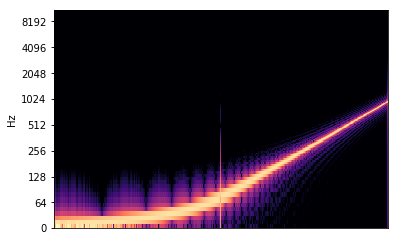

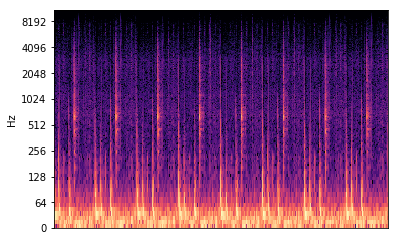

In [8]:
# Hyper parameters.
seed                    = 42
attention_method        = 'general'
path_a                  = './massive_chops/two_bar/riser_two_bar.wav'
path_b                  = './massive_chops/two_bar/drums_a_two_bar.wav'
fft_size                = 512
number_layers           = 4 # Was 4
dropout                 = 0.0
sequence_length         = 150 # was 50, 150
clip_threshold          = 5.0
criterion               = nn.MSELoss()
learning_rate           = 0.00001
decoder_learning_ratio  = 5.0
batch_size              = 128 # was 64
number_epochs           = 500
evaluate_every_epoch    = 20
amount_evaluation_plots = 1
feature_size = input_size = hidden_size = (fft_size // 2) + 1
hop_length = fft_size // 4

print("Settings Done.")

# Construct RNNs and optimisers.
encoder = EncoderRNN(input_size=feature_size,
                     batch_size=batch_size,
                     hidden_size=feature_size,
                     number_layers=number_layers,
                     dropout=dropout)

print("Encoder Done.")

decoder = AttentionDecoderRNN(attention_method,
                              batch_size=batch_size,
                              hidden_size=hidden_size,
                              output_size=feature_size,
                              number_layers=number_layers,
                              dropout=dropout)

print("Decoder Done.")

# Enable GPU tensors provided GPUs actually exist!
if torch.cuda.is_available():
    encoder.cuda()
    decoder.cuda()
    criterion.cuda()
    torch.cuda.manual_seed(seed)
else:
    torch.manual_seed(seed)

encoder_optimiser = torch.optim.Adam(encoder.parameters(), lr=learning_rate)
decoder_optimiser = torch.optim.Adam(decoder.parameters(), 
                                     lr=learning_rate * decoder_learning_ratio)

dataset = A2BDataset(path_a, 
                     path_b, 
                     fft_size, 
                     hop_length,
                     batch_size,
                     sequence_length)

testset = TestA2BDataset(path_a, 
                         path_b, 
                         fft_size, 
                         hop_length,
                         batch_size,
                         sequence_length)

# Plot and listen to the audio.
plot_audio(dataset.data_a) 
plot_audio(dataset.data_b) 

In [9]:
IPython.display.Audio(dataset.data_a, rate=dataset.sample_rate)

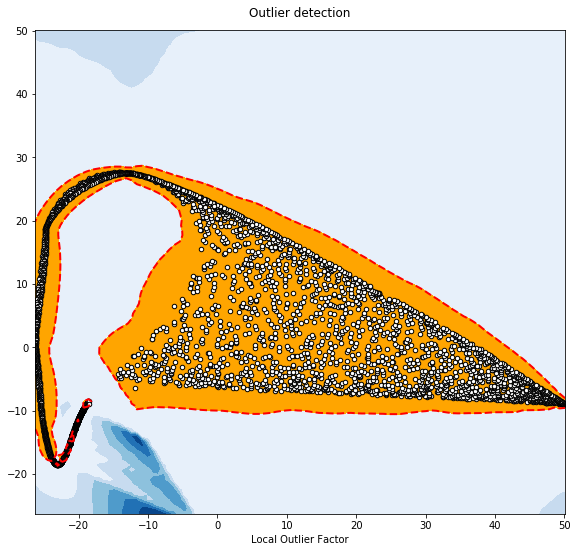

In [10]:
_ = outlier_detection(dataset.magnitudes_a, contamination_fraction=0.01, inline=True)

In [11]:
IPython.display.Audio(dataset.data_b, rate=dataset.sample_rate)

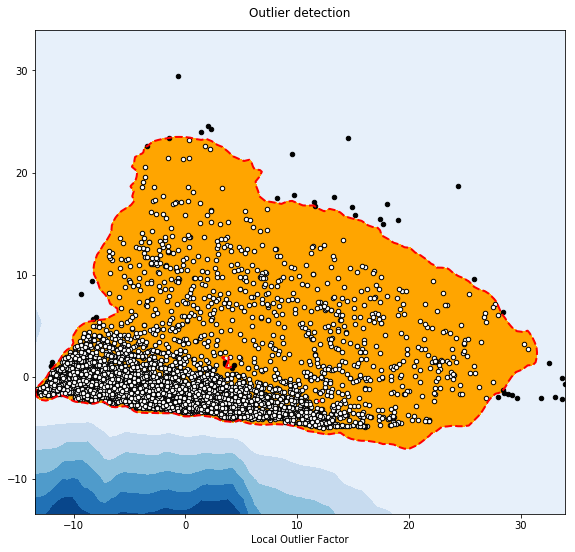

In [12]:
_ = outlier_detection(dataset.magnitudes_b, contamination_fraction=0.01, inline=True)

/home/eavi/leon/leon/lib/python3.5/site-packages/ipykernel_launcher.py:130: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
/home/eavi/leon/leon/lib/python3.5/site-packages/librosa/util/utils.py:1725: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  if np.issubdtype(x.dtype, float) or np.issubdtype(x.dtype, complex):
/home/eavi/leon/leon/lib/python3.5/site-packages/librosa/display.py:656: FutureWarning: Conversion of the second argument of issubdtype from `complex` to `np.complexfloating` is deprecated. In future, it will be treated as `np.complex128 == np.dtype(complex).type`.
  if np.issubdtype(data.dtype, np.complex):


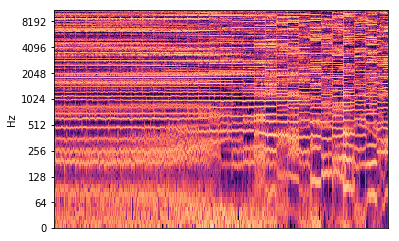

epoch 0/500, loss 1.051328420639038
epoch 0/500, loss 1.0335818529129028
epoch 0/500, loss 1.0441112518310547
epoch 0/500, loss 1.0123968124389648
epoch 0/500, loss 1.0511747598648071
epoch 0/500, loss 1.0379709005355835
epoch 0/500, loss 1.016850233078003
epoch 0/500, loss 0.9997391700744629
epoch 0/500, loss 0.9937949180603027
epoch 0/500, loss 0.956619143486023
epoch 0/500, loss 0.9843286871910095
epoch 0/500, loss 0.9710403680801392
epoch 0/500, loss 0.9639953374862671
epoch 0/500, loss 0.998858630657196
epoch 0/500, loss 0.9335631728172302
epoch 0/500, loss 0.9448599815368652
epoch 0/500, loss 0.9109609127044678
epoch 0/500, loss 0.9642049670219421
epoch 0/500, loss 0.9074978828430176
epoch 0/500, loss 0.8765932321548462
epoch 0/500, loss 0.9654498100280762
epoch 0/500, loss 0.9365237951278687
epoch 0/500, loss 0.8774930238723755
epoch 0/500, loss 0.8718441128730774
epoch 0/500, loss 0.9077197909355164
epoch 0/500, loss 0.8772045373916626
epoch 0/500, loss 0.8937058448791504
epoch

epoch 6/500, loss 0.36771532893180847
epoch 6/500, loss 0.3725444972515106
epoch 6/500, loss 0.36938753724098206
epoch 6/500, loss 0.36885765194892883
epoch 6/500, loss 0.345213919878006
epoch 6/500, loss 0.38260239362716675
epoch 6/500, loss 0.37569907307624817
epoch 6/500, loss 0.37445276975631714
epoch 6/500, loss 0.3800777792930603
epoch 6/500, loss 0.36368003487586975
epoch 6/500, loss 0.36864161491394043
epoch 6/500, loss 0.38005396723747253
epoch 6/500, loss 0.3602698743343353
epoch 6/500, loss 0.35382550954818726
epoch 6/500, loss 0.37405818700790405
epoch 6/500, loss 0.3817107379436493
epoch 6/500, loss 0.37315598130226135
epoch 7/500, loss 0.3540135324001312
epoch 7/500, loss 0.35513949394226074
epoch 7/500, loss 0.3621368706226349
epoch 7/500, loss 0.3689406216144562
epoch 7/500, loss 0.386591374874115
epoch 7/500, loss 0.3696325719356537
epoch 7/500, loss 0.3594295084476471
epoch 7/500, loss 0.37108609080314636
epoch 7/500, loss 0.36483505368232727
epoch 7/500, loss 0.38351

epoch 12/500, loss 0.34101223945617676
epoch 12/500, loss 0.36901307106018066
epoch 12/500, loss 0.3635796308517456
epoch 12/500, loss 0.34026071429252625
epoch 13/500, loss 0.35834863781929016
epoch 13/500, loss 0.3580590486526489
epoch 13/500, loss 0.35444143414497375
epoch 13/500, loss 0.3579450845718384
epoch 13/500, loss 0.3598931133747101
epoch 13/500, loss 0.3605605363845825
epoch 13/500, loss 0.3664880096912384
epoch 13/500, loss 0.3824132978916168
epoch 13/500, loss 0.3737022280693054
epoch 13/500, loss 0.3464295566082001
epoch 13/500, loss 0.3741430640220642
epoch 13/500, loss 0.36987292766571045
epoch 13/500, loss 0.3563635051250458
epoch 13/500, loss 0.3607626259326935
epoch 13/500, loss 0.3646257221698761
epoch 13/500, loss 0.3551938831806183
epoch 13/500, loss 0.3552211821079254
epoch 13/500, loss 0.34812435507774353
epoch 13/500, loss 0.35268887877464294
epoch 13/500, loss 0.35927292704582214
epoch 13/500, loss 0.33207646012306213
epoch 13/500, loss 0.3658194839954376
ep

epoch 19/500, loss 0.3498045802116394
epoch 19/500, loss 0.3583222031593323
epoch 19/500, loss 0.3551942706108093
epoch 19/500, loss 0.37837064266204834
epoch 19/500, loss 0.3923439383506775
epoch 19/500, loss 0.3411172032356262
epoch 19/500, loss 0.34079697728157043
epoch 19/500, loss 0.3589024543762207
epoch 19/500, loss 0.3533307909965515
epoch 19/500, loss 0.34345898032188416
epoch 19/500, loss 0.3572939336299896
epoch 19/500, loss 0.35739612579345703
epoch 19/500, loss 0.34488216042518616
epoch 19/500, loss 0.345068097114563
epoch 19/500, loss 0.34367725253105164
epoch 19/500, loss 0.3495182693004608
epoch 19/500, loss 0.3376688063144684
epoch 19/500, loss 0.355139821767807
epoch 19/500, loss 0.33323049545288086
epoch 19/500, loss 0.3543420135974884
epoch 19/500, loss 0.3325694501399994
epoch 19/500, loss 0.34693166613578796
epoch 19/500, loss 0.35207128524780273
epoch 19/500, loss 0.35846877098083496
epoch 19/500, loss 0.3726821839809418
epoch 19/500, loss 0.3684786558151245
epoc

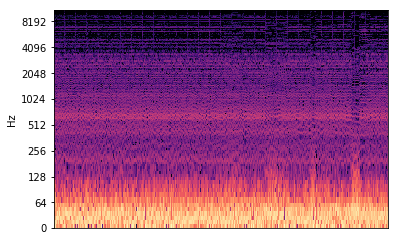

epoch 20/500, loss 0.36701881885528564
epoch 20/500, loss 0.3446342945098877
epoch 20/500, loss 0.3456503450870514
epoch 20/500, loss 0.3502098619937897
epoch 20/500, loss 0.34552305936813354
epoch 20/500, loss 0.3530973494052887
epoch 20/500, loss 0.3613366484642029
epoch 20/500, loss 0.3445163071155548
epoch 20/500, loss 0.33707714080810547
epoch 20/500, loss 0.34021472930908203
epoch 20/500, loss 0.38500353693962097
epoch 20/500, loss 0.3419523239135742
epoch 20/500, loss 0.35719868540763855
epoch 20/500, loss 0.3477480709552765
epoch 20/500, loss 0.3592880964279175
epoch 20/500, loss 0.35303598642349243
epoch 20/500, loss 0.35182124376296997
epoch 20/500, loss 0.34361371397972107
epoch 20/500, loss 0.35651353001594543
epoch 20/500, loss 0.341789186000824
epoch 20/500, loss 0.3523690700531006
epoch 20/500, loss 0.34924209117889404
epoch 20/500, loss 0.34824949502944946
epoch 20/500, loss 0.35065221786499023
epoch 20/500, loss 0.35344186425209045
epoch 20/500, loss 0.3428154289722442

epoch 26/500, loss 0.3314858078956604
epoch 26/500, loss 0.3330475687980652
epoch 26/500, loss 0.34194236993789673
epoch 26/500, loss 0.34365883469581604
epoch 26/500, loss 0.35767868161201477
epoch 26/500, loss 0.3364638686180115
epoch 26/500, loss 0.3342835307121277
epoch 26/500, loss 0.34328824281692505
epoch 26/500, loss 0.33725446462631226
epoch 26/500, loss 0.3415513336658478
epoch 26/500, loss 0.35067400336265564
epoch 26/500, loss 0.32572996616363525
epoch 26/500, loss 0.331500381231308
epoch 26/500, loss 0.3398374021053314
epoch 26/500, loss 0.3376087546348572
epoch 26/500, loss 0.36867183446884155
epoch 26/500, loss 0.34095704555511475
epoch 26/500, loss 0.3394840657711029
epoch 26/500, loss 0.34007227420806885
epoch 26/500, loss 0.345960795879364
epoch 26/500, loss 0.3354388475418091
epoch 26/500, loss 0.3320200443267822
epoch 26/500, loss 0.33030611276626587
epoch 26/500, loss 0.3538782298564911
epoch 27/500, loss 0.3379887640476227
epoch 27/500, loss 0.347842276096344
epoc

epoch 32/500, loss 0.3299240171909332
epoch 32/500, loss 0.3236064314842224
epoch 32/500, loss 0.34709349274635315
epoch 32/500, loss 0.3533155620098114
epoch 32/500, loss 0.33330413699150085
epoch 32/500, loss 0.327363520860672
epoch 32/500, loss 0.3321854770183563
epoch 32/500, loss 0.32324904203414917
epoch 32/500, loss 0.3214307129383087
epoch 32/500, loss 0.34165170788764954
epoch 32/500, loss 0.34677693247795105
epoch 32/500, loss 0.3418065011501312
epoch 32/500, loss 0.33702561259269714
epoch 32/500, loss 0.31483009457588196
epoch 33/500, loss 0.3421087861061096
epoch 33/500, loss 0.3355637490749359
epoch 33/500, loss 0.36187899112701416
epoch 33/500, loss 0.34386399388313293
epoch 33/500, loss 0.3263353407382965
epoch 33/500, loss 0.32243257761001587
epoch 33/500, loss 0.32406461238861084
epoch 33/500, loss 0.3417840898036957
epoch 33/500, loss 0.33964207768440247
epoch 33/500, loss 0.3370611369609833
epoch 33/500, loss 0.33003559708595276
epoch 33/500, loss 0.31919804215431213

epoch 38/500, loss 0.3362713158130646
epoch 38/500, loss 0.33160653710365295
epoch 38/500, loss 0.34130242466926575
epoch 38/500, loss 0.31519967317581177
epoch 39/500, loss 0.3348228335380554
epoch 39/500, loss 0.33363375067710876
epoch 39/500, loss 0.32617032527923584
epoch 39/500, loss 0.3291183412075043
epoch 39/500, loss 0.34575355052948
epoch 39/500, loss 0.3478059768676758
epoch 39/500, loss 0.3301427662372589
epoch 39/500, loss 0.32925742864608765
epoch 39/500, loss 0.33704647421836853
epoch 39/500, loss 0.32095441222190857
epoch 39/500, loss 0.32963916659355164
epoch 39/500, loss 0.34615790843963623
epoch 39/500, loss 0.3268578350543976
epoch 39/500, loss 0.31624481081962585
epoch 39/500, loss 0.3174506425857544
epoch 39/500, loss 0.330450177192688
epoch 39/500, loss 0.3224825859069824
epoch 39/500, loss 0.3136287331581116
epoch 39/500, loss 0.3438264727592468
epoch 39/500, loss 0.30802249908447266
epoch 39/500, loss 0.33348989486694336
epoch 39/500, loss 0.333700031042099
epo

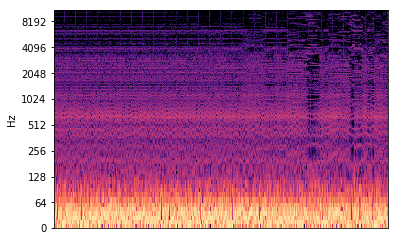

epoch 40/500, loss 0.31838300824165344
epoch 40/500, loss 0.3322952091693878
epoch 40/500, loss 0.30337491631507874
epoch 40/500, loss 0.3335402011871338
epoch 40/500, loss 0.342774361371994
epoch 40/500, loss 0.3387792110443115
epoch 40/500, loss 0.3407423794269562
epoch 40/500, loss 0.31531044840812683
epoch 40/500, loss 0.3327023684978485
epoch 40/500, loss 0.33148106932640076
epoch 40/500, loss 0.33044931292533875
epoch 40/500, loss 0.3140951991081238
epoch 40/500, loss 0.31775760650634766
epoch 40/500, loss 0.3122437596321106
epoch 40/500, loss 0.3280494511127472
epoch 40/500, loss 0.3158677816390991
epoch 40/500, loss 0.31748825311660767
epoch 40/500, loss 0.3276171386241913
epoch 40/500, loss 0.33433273434638977
epoch 40/500, loss 0.3356923460960388
epoch 40/500, loss 0.3367430567741394
epoch 40/500, loss 0.31736379861831665
epoch 40/500, loss 0.31465625762939453
epoch 40/500, loss 0.3524632751941681
epoch 40/500, loss 0.34336262941360474
epoch 40/500, loss 0.3166610598564148
ep

epoch 46/500, loss 0.3263377547264099
epoch 46/500, loss 0.32803991436958313
epoch 46/500, loss 0.33296042680740356
epoch 46/500, loss 0.32645490765571594
epoch 46/500, loss 0.30940425395965576
epoch 46/500, loss 0.3201255798339844
epoch 46/500, loss 0.3311549127101898
epoch 46/500, loss 0.32413625717163086
epoch 46/500, loss 0.32608434557914734
epoch 46/500, loss 0.3150761127471924
epoch 46/500, loss 0.31978869438171387
epoch 46/500, loss 0.32462936639785767
epoch 46/500, loss 0.3197249472141266
epoch 46/500, loss 0.35142087936401367
epoch 46/500, loss 0.316606342792511
epoch 46/500, loss 0.323191374540329
epoch 46/500, loss 0.3337710201740265
epoch 46/500, loss 0.3231755793094635
epoch 46/500, loss 0.33726662397384644
epoch 46/500, loss 0.33630943298339844
epoch 46/500, loss 0.3163723051548004
epoch 46/500, loss 0.3118385076522827
epoch 46/500, loss 0.3345443904399872
epoch 46/500, loss 0.32341939210891724
epoch 47/500, loss 0.33114704489707947
epoch 47/500, loss 0.32864001393318176


epoch 52/500, loss 0.32640597224235535
epoch 52/500, loss 0.313748836517334
epoch 52/500, loss 0.3151249289512634
epoch 52/500, loss 0.3222205638885498
epoch 52/500, loss 0.3313828706741333
epoch 52/500, loss 0.3235494792461395
epoch 52/500, loss 0.32529908418655396
epoch 52/500, loss 0.3192847669124603
epoch 52/500, loss 0.3289799988269806
epoch 52/500, loss 0.32448479533195496
epoch 52/500, loss 0.3246856927871704
epoch 52/500, loss 0.310688316822052
epoch 52/500, loss 0.32379528880119324
epoch 52/500, loss 0.3172958791255951
epoch 53/500, loss 0.3344021439552307
epoch 53/500, loss 0.32719936966896057
epoch 53/500, loss 0.3262600898742676
epoch 53/500, loss 0.3411180377006531
epoch 53/500, loss 0.32666632533073425
epoch 53/500, loss 0.3259430229663849
epoch 53/500, loss 0.32274046540260315
epoch 53/500, loss 0.3115695118904114
epoch 53/500, loss 0.3115765154361725
epoch 53/500, loss 0.33853471279144287
epoch 53/500, loss 0.3116993308067322
epoch 53/500, loss 0.32035401463508606
epoch

epoch 58/500, loss 0.30919337272644043
epoch 58/500, loss 0.31469202041625977
epoch 58/500, loss 0.3198724091053009
epoch 58/500, loss 0.3133516311645508
epoch 59/500, loss 0.31587138772010803
epoch 59/500, loss 0.30141550302505493
epoch 59/500, loss 0.31058958172798157
epoch 59/500, loss 0.32533833384513855
epoch 59/500, loss 0.3206876218318939
epoch 59/500, loss 0.3240900933742523
epoch 59/500, loss 0.3234803080558777
epoch 59/500, loss 0.33628615736961365
epoch 59/500, loss 0.33223384618759155
epoch 59/500, loss 0.3080122768878937
epoch 59/500, loss 0.3094305396080017
epoch 59/500, loss 0.3110126852989197
epoch 59/500, loss 0.31062939763069153
epoch 59/500, loss 0.32513681054115295
epoch 59/500, loss 0.31466028094291687
epoch 59/500, loss 0.3257395029067993
epoch 59/500, loss 0.3042518198490143
epoch 59/500, loss 0.3234858810901642
epoch 59/500, loss 0.3042987883090973
epoch 59/500, loss 0.3040550947189331
epoch 59/500, loss 0.29011431336402893
epoch 59/500, loss 0.3355858325958252


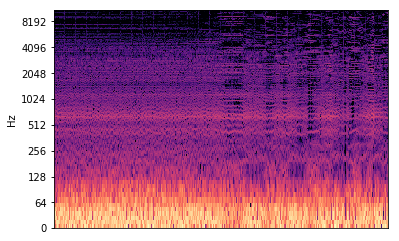

epoch 60/500, loss 0.30785220861434937
epoch 60/500, loss 0.3009677827358246
epoch 60/500, loss 0.29746416211128235
epoch 60/500, loss 0.3160683810710907
epoch 60/500, loss 0.3063984811306
epoch 60/500, loss 0.31353235244750977
epoch 60/500, loss 0.29704126715660095
epoch 60/500, loss 0.32070043683052063
epoch 60/500, loss 0.3180810213088989
epoch 60/500, loss 0.31308913230895996
epoch 60/500, loss 0.3092113435268402
epoch 60/500, loss 0.32102465629577637
epoch 60/500, loss 0.3382175862789154
epoch 60/500, loss 0.3189202845096588
epoch 60/500, loss 0.3157234787940979
epoch 60/500, loss 0.3178504407405853
epoch 60/500, loss 0.31136515736579895
epoch 60/500, loss 0.3195357024669647
epoch 60/500, loss 0.3154025673866272
epoch 60/500, loss 0.3168160915374756
epoch 60/500, loss 0.327008992433548
epoch 60/500, loss 0.3224834203720093
epoch 60/500, loss 0.31184881925582886
epoch 60/500, loss 0.29614266753196716
epoch 60/500, loss 0.31444597244262695
epoch 60/500, loss 0.3097970485687256
epoch

epoch 66/500, loss 0.2980441749095917
epoch 66/500, loss 0.2961256206035614
epoch 66/500, loss 0.2958355247974396
epoch 66/500, loss 0.29069647192955017
epoch 66/500, loss 0.3017171323299408
epoch 66/500, loss 0.3155931830406189
epoch 66/500, loss 0.31344887614250183
epoch 66/500, loss 0.3147467076778412
epoch 66/500, loss 0.29824239015579224
epoch 66/500, loss 0.3141076862812042
epoch 66/500, loss 0.31176871061325073
epoch 66/500, loss 0.3173466622829437
epoch 66/500, loss 0.29712343215942383
epoch 66/500, loss 0.3139391541481018
epoch 66/500, loss 0.29258137941360474
epoch 66/500, loss 0.3073962926864624
epoch 66/500, loss 0.3030993938446045
epoch 66/500, loss 0.3059622347354889
epoch 66/500, loss 0.2995108962059021
epoch 66/500, loss 0.3052777945995331
epoch 66/500, loss 0.30189815163612366
epoch 66/500, loss 0.3055243194103241
epoch 66/500, loss 0.31027916073799133
epoch 66/500, loss 0.3040529489517212
epoch 67/500, loss 0.31123805046081543
epoch 67/500, loss 0.3113359212875366
epo

epoch 72/500, loss 0.2992335557937622
epoch 72/500, loss 0.28893280029296875
epoch 72/500, loss 0.3010774850845337
epoch 72/500, loss 0.2940090596675873
epoch 72/500, loss 0.30371230840682983
epoch 72/500, loss 0.30354857444763184
epoch 72/500, loss 0.29809045791625977
epoch 72/500, loss 0.32153648138046265
epoch 72/500, loss 0.2950419485569
epoch 72/500, loss 0.30246132612228394
epoch 72/500, loss 0.2879847586154938
epoch 72/500, loss 0.3062267005443573
epoch 72/500, loss 0.29865938425064087
epoch 72/500, loss 0.29326459765434265
epoch 73/500, loss 0.30803990364074707
epoch 73/500, loss 0.29974716901779175
epoch 73/500, loss 0.30137136578559875
epoch 73/500, loss 0.29807284474372864
epoch 73/500, loss 0.285847008228302
epoch 73/500, loss 0.2931769788265228
epoch 73/500, loss 0.2902245819568634
epoch 73/500, loss 0.30778348445892334
epoch 73/500, loss 0.29931896924972534
epoch 73/500, loss 0.3006473779678345
epoch 73/500, loss 0.3004145920276642
epoch 73/500, loss 0.29279953241348267
e

epoch 78/500, loss 0.2924293875694275
epoch 78/500, loss 0.2981494665145874
epoch 78/500, loss 0.28174281120300293
epoch 78/500, loss 0.29333391785621643
epoch 79/500, loss 0.29027408361434937
epoch 79/500, loss 0.2902497947216034
epoch 79/500, loss 0.29500558972358704
epoch 79/500, loss 0.2872858941555023
epoch 79/500, loss 0.2925945818424225
epoch 79/500, loss 0.300832599401474
epoch 79/500, loss 0.2977350652217865
epoch 79/500, loss 0.29823338985443115
epoch 79/500, loss 0.28669148683547974
epoch 79/500, loss 0.29136988520622253
epoch 79/500, loss 0.29635995626449585
epoch 79/500, loss 0.29729485511779785
epoch 79/500, loss 0.29184719920158386
epoch 79/500, loss 0.27395081520080566
epoch 79/500, loss 0.2807351350784302
epoch 79/500, loss 0.2912817597389221
epoch 79/500, loss 0.28842905163764954
epoch 79/500, loss 0.29896360635757446
epoch 79/500, loss 0.29478660225868225
epoch 79/500, loss 0.2906734347343445
epoch 79/500, loss 0.28741586208343506
epoch 79/500, loss 0.301749616861343

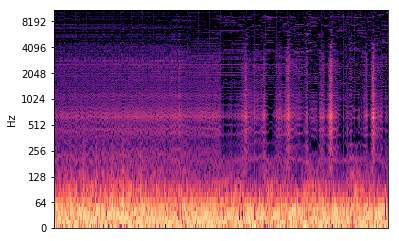

epoch 80/500, loss 0.2982635796070099
epoch 80/500, loss 0.27563950419425964
epoch 80/500, loss 0.3017094135284424
epoch 80/500, loss 0.29087570309638977
epoch 80/500, loss 0.29860320687294006
epoch 80/500, loss 0.28647536039352417
epoch 80/500, loss 0.29973503947257996
epoch 80/500, loss 0.28585895895957947
epoch 80/500, loss 0.29292216897010803
epoch 80/500, loss 0.29280397295951843
epoch 80/500, loss 0.28337740898132324
epoch 80/500, loss 0.28268519043922424
epoch 80/500, loss 0.2942250967025757
epoch 80/500, loss 0.2958768308162689
epoch 80/500, loss 0.2934429347515106
epoch 80/500, loss 0.2940041422843933
epoch 80/500, loss 0.2994164824485779
epoch 80/500, loss 0.2866913378238678
epoch 80/500, loss 0.2867644429206848
epoch 80/500, loss 0.28205689787864685
epoch 80/500, loss 0.29924100637435913
epoch 80/500, loss 0.2976222634315491
epoch 80/500, loss 0.28512799739837646
epoch 80/500, loss 0.28303828835487366
epoch 80/500, loss 0.28736576437950134
epoch 80/500, loss 0.28765338659286

epoch 86/500, loss 0.2766549289226532
epoch 86/500, loss 0.29761502146720886
epoch 86/500, loss 0.2943692207336426
epoch 86/500, loss 0.28556278347969055
epoch 86/500, loss 0.28430843353271484
epoch 86/500, loss 0.2864879071712494
epoch 86/500, loss 0.2802373468875885
epoch 86/500, loss 0.29060283303260803
epoch 86/500, loss 0.28475436568260193
epoch 86/500, loss 0.2836571931838989
epoch 86/500, loss 0.28483709692955017
epoch 86/500, loss 0.2780739367008209
epoch 86/500, loss 0.2886430621147156
epoch 86/500, loss 0.3026602864265442
epoch 86/500, loss 0.27642300724983215
epoch 86/500, loss 0.2987316846847534
epoch 86/500, loss 0.27970388531684875
epoch 86/500, loss 0.28598421812057495
epoch 86/500, loss 0.2918873727321625
epoch 86/500, loss 0.28470897674560547
epoch 86/500, loss 0.28531545400619507
epoch 86/500, loss 0.2864486575126648
epoch 86/500, loss 0.28337299823760986
epoch 86/500, loss 0.2769247889518738
epoch 87/500, loss 0.2831847667694092
epoch 87/500, loss 0.2784897983074188


epoch 92/500, loss 0.2843968868255615
epoch 92/500, loss 0.27487096190452576
epoch 92/500, loss 0.2768489718437195
epoch 92/500, loss 0.28501877188682556
epoch 92/500, loss 0.3009163737297058
epoch 92/500, loss 0.28475236892700195
epoch 92/500, loss 0.28521591424942017
epoch 92/500, loss 0.2804509103298187
epoch 92/500, loss 0.28329136967658997
epoch 92/500, loss 0.2655983865261078
epoch 92/500, loss 0.27855396270751953
epoch 92/500, loss 0.27392885088920593
epoch 92/500, loss 0.28910741209983826
epoch 92/500, loss 0.27658283710479736
epoch 93/500, loss 0.27332180738449097
epoch 93/500, loss 0.28327298164367676
epoch 93/500, loss 0.26820486783981323
epoch 93/500, loss 0.2880783677101135
epoch 93/500, loss 0.2899719178676605
epoch 93/500, loss 0.2714952826499939
epoch 93/500, loss 0.26980459690093994
epoch 93/500, loss 0.29340729117393494
epoch 93/500, loss 0.28491920232772827
epoch 93/500, loss 0.28037020564079285
epoch 93/500, loss 0.2770439088344574
epoch 93/500, loss 0.2870444655418

epoch 98/500, loss 0.28605949878692627
epoch 98/500, loss 0.2714310586452484
epoch 98/500, loss 0.27626627683639526
epoch 98/500, loss 0.28049278259277344
epoch 99/500, loss 0.2935788631439209
epoch 99/500, loss 0.27935388684272766
epoch 99/500, loss 0.28285670280456543
epoch 99/500, loss 0.2742820680141449
epoch 99/500, loss 0.2717532515525818
epoch 99/500, loss 0.269621878862381
epoch 99/500, loss 0.26788872480392456
epoch 99/500, loss 0.2699091136455536
epoch 99/500, loss 0.2865082323551178
epoch 99/500, loss 0.2833113968372345
epoch 99/500, loss 0.2669587731361389
epoch 99/500, loss 0.2688944339752197
epoch 99/500, loss 0.2771700918674469
epoch 99/500, loss 0.2882860600948334
epoch 99/500, loss 0.27426061034202576
epoch 99/500, loss 0.28268325328826904
epoch 99/500, loss 0.2736535966396332
epoch 99/500, loss 0.26533079147338867
epoch 99/500, loss 0.2724500894546509
epoch 99/500, loss 0.281705766916275
epoch 99/500, loss 0.2804059386253357
epoch 99/500, loss 0.2775667607784271
epoch

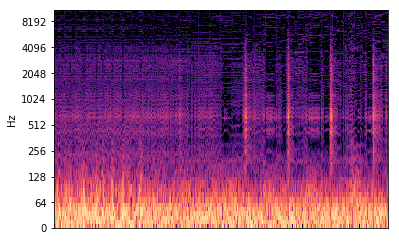

epoch 100/500, loss 0.2692735195159912
epoch 100/500, loss 0.2752840518951416
epoch 100/500, loss 0.2774973511695862
epoch 100/500, loss 0.28902459144592285
epoch 100/500, loss 0.2691524028778076
epoch 100/500, loss 0.28194305300712585
epoch 100/500, loss 0.28394371271133423
epoch 100/500, loss 0.2857673168182373
epoch 100/500, loss 0.27905264496803284
epoch 100/500, loss 0.2696119546890259
epoch 100/500, loss 0.27503323554992676
epoch 100/500, loss 0.2612902820110321
epoch 100/500, loss 0.27596867084503174
epoch 100/500, loss 0.2706049084663391
epoch 100/500, loss 0.27141332626342773
epoch 100/500, loss 0.2743709087371826
epoch 100/500, loss 0.28305739164352417
epoch 100/500, loss 0.27846717834472656
epoch 100/500, loss 0.278469055891037
epoch 100/500, loss 0.27788782119750977
epoch 100/500, loss 0.2731884717941284
epoch 100/500, loss 0.2881183922290802
epoch 100/500, loss 0.27175161242485046
epoch 100/500, loss 0.2710142433643341
epoch 100/500, loss 0.2660859227180481
epoch 100/500, 

epoch 106/500, loss 0.2794278562068939
epoch 106/500, loss 0.2626710534095764
epoch 106/500, loss 0.2716832160949707
epoch 106/500, loss 0.2699876129627228
epoch 106/500, loss 0.27543380856513977
epoch 106/500, loss 0.28139522671699524
epoch 106/500, loss 0.2846834063529968
epoch 106/500, loss 0.27516213059425354
epoch 106/500, loss 0.28091514110565186
epoch 106/500, loss 0.2860254645347595
epoch 106/500, loss 0.277072548866272
epoch 106/500, loss 0.25664952397346497
epoch 106/500, loss 0.2625979483127594
epoch 106/500, loss 0.26731666922569275
epoch 106/500, loss 0.2644171714782715
epoch 106/500, loss 0.27209216356277466
epoch 106/500, loss 0.285792738199234
epoch 106/500, loss 0.2645070552825928
epoch 106/500, loss 0.25825080275535583
epoch 106/500, loss 0.2869076132774353
epoch 106/500, loss 0.28046494722366333
epoch 106/500, loss 0.27610865235328674
epoch 106/500, loss 0.2736778259277344
epoch 106/500, loss 0.27695319056510925
epoch 106/500, loss 0.2796178162097931
epoch 106/500, l

epoch 112/500, loss 0.2776850163936615
epoch 112/500, loss 0.2524673342704773
epoch 112/500, loss 0.26375895738601685
epoch 112/500, loss 0.28761038184165955
epoch 112/500, loss 0.26697248220443726
epoch 112/500, loss 0.26020359992980957
epoch 112/500, loss 0.27112504839897156
epoch 112/500, loss 0.2727646231651306
epoch 112/500, loss 0.27500876784324646
epoch 112/500, loss 0.2662472128868103
epoch 112/500, loss 0.2697948217391968
epoch 112/500, loss 0.26958996057510376
epoch 112/500, loss 0.26589882373809814
epoch 112/500, loss 0.2584168314933777
epoch 112/500, loss 0.27402597665786743
epoch 112/500, loss 0.2640794813632965
epoch 112/500, loss 0.266431987285614
epoch 112/500, loss 0.2786557078361511
epoch 112/500, loss 0.26420164108276367
epoch 112/500, loss 0.28539666533470154
epoch 112/500, loss 0.27304792404174805
epoch 112/500, loss 0.26869696378707886
epoch 112/500, loss 0.2657833695411682
epoch 112/500, loss 0.2667039930820465
epoch 113/500, loss 0.2726808488368988
epoch 113/500

epoch 118/500, loss 0.2587774991989136
epoch 118/500, loss 0.26212841272354126
epoch 118/500, loss 0.2593519985675812
epoch 118/500, loss 0.25002390146255493
epoch 118/500, loss 0.2678864598274231
epoch 118/500, loss 0.27395400404930115
epoch 118/500, loss 0.28633299469947815
epoch 118/500, loss 0.26681631803512573
epoch 118/500, loss 0.2827003002166748
epoch 118/500, loss 0.2702844738960266
epoch 118/500, loss 0.2668469548225403
epoch 118/500, loss 0.2639559209346771
epoch 118/500, loss 0.26112380623817444
epoch 118/500, loss 0.2649467885494232
epoch 118/500, loss 0.2723194658756256
epoch 118/500, loss 0.2740136682987213
epoch 118/500, loss 0.261082261800766
epoch 118/500, loss 0.2711326479911804
epoch 118/500, loss 0.2724568247795105
epoch 118/500, loss 0.25830769538879395
epoch 119/500, loss 0.2574025094509125
epoch 119/500, loss 0.25399667024612427
epoch 119/500, loss 0.2841171324253082
epoch 119/500, loss 0.2581751048564911
epoch 119/500, loss 0.26949822902679443
epoch 119/500, lo

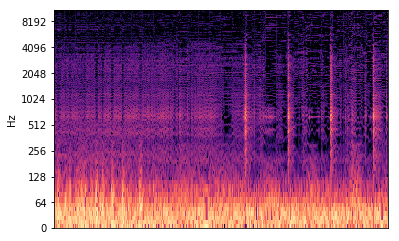

epoch 120/500, loss 0.27958932518959045
epoch 120/500, loss 0.27032211422920227
epoch 120/500, loss 0.26425468921661377
epoch 120/500, loss 0.26865509152412415
epoch 120/500, loss 0.2703733444213867
epoch 120/500, loss 0.25983667373657227
epoch 120/500, loss 0.27193039655685425
epoch 120/500, loss 0.2654467523097992
epoch 120/500, loss 0.2756359577178955
epoch 120/500, loss 0.2527486979961395
epoch 120/500, loss 0.2743060886859894
epoch 120/500, loss 0.2672150731086731
epoch 120/500, loss 0.2625434398651123
epoch 120/500, loss 0.2736320495605469
epoch 120/500, loss 0.25813958048820496
epoch 120/500, loss 0.25622373819351196
epoch 120/500, loss 0.26097607612609863
epoch 120/500, loss 0.27287599444389343
epoch 120/500, loss 0.2548143267631531
epoch 120/500, loss 0.2533026337623596
epoch 120/500, loss 0.27071210741996765
epoch 120/500, loss 0.2652963697910309
epoch 120/500, loss 0.272433876991272
epoch 120/500, loss 0.26455825567245483
epoch 120/500, loss 0.26151779294013977
epoch 120/500

epoch 126/500, loss 0.26062747836112976
epoch 126/500, loss 0.2684779167175293
epoch 126/500, loss 0.26385727524757385
epoch 126/500, loss 0.2559413015842438
epoch 126/500, loss 0.2694099247455597
epoch 126/500, loss 0.25541508197784424
epoch 126/500, loss 0.2795029878616333
epoch 126/500, loss 0.2719540596008301
epoch 126/500, loss 0.26848116517066956
epoch 126/500, loss 0.26916539669036865
epoch 126/500, loss 0.2631966173648834
epoch 126/500, loss 0.256896436214447
epoch 126/500, loss 0.2743251919746399
epoch 126/500, loss 0.280661016702652
epoch 126/500, loss 0.2617955505847931
epoch 126/500, loss 0.2575819492340088
epoch 126/500, loss 0.26610061526298523
epoch 126/500, loss 0.28078702092170715
epoch 126/500, loss 0.26814839243888855
epoch 126/500, loss 0.26887232065200806
epoch 126/500, loss 0.263277143239975
epoch 126/500, loss 0.27396532893180847
epoch 126/500, loss 0.26604747772216797
epoch 126/500, loss 0.2610818147659302
epoch 126/500, loss 0.2467726618051529
epoch 126/500, lo

epoch 132/500, loss 0.27283552289009094
epoch 132/500, loss 0.24659036099910736
epoch 132/500, loss 0.2541314363479614
epoch 132/500, loss 0.2571578323841095
epoch 132/500, loss 0.26189181208610535
epoch 132/500, loss 0.26196643710136414
epoch 132/500, loss 0.25110846757888794
epoch 132/500, loss 0.2581911087036133
epoch 132/500, loss 0.25609850883483887
epoch 132/500, loss 0.25688910484313965
epoch 132/500, loss 0.2735196650028229
epoch 132/500, loss 0.2731180787086487
epoch 132/500, loss 0.24984830617904663
epoch 132/500, loss 0.26559513807296753
epoch 132/500, loss 0.2673509120941162
epoch 132/500, loss 0.26777395606040955
epoch 132/500, loss 0.25749197602272034
epoch 132/500, loss 0.24866972863674164
epoch 132/500, loss 0.2567138969898224
epoch 132/500, loss 0.2593984603881836
epoch 132/500, loss 0.2631468176841736
epoch 132/500, loss 0.27466902136802673
epoch 132/500, loss 0.24905936419963837
epoch 132/500, loss 0.2619103193283081
epoch 132/500, loss 0.2659270763397217
epoch 133/5

epoch 138/500, loss 0.24479544162750244
epoch 138/500, loss 0.25337740778923035
epoch 138/500, loss 0.25922730565071106
epoch 138/500, loss 0.25897616147994995
epoch 138/500, loss 0.24485062062740326
epoch 138/500, loss 0.2627285420894623
epoch 138/500, loss 0.2590099275112152
epoch 138/500, loss 0.25531235337257385
epoch 138/500, loss 0.2602860629558563
epoch 138/500, loss 0.27103501558303833
epoch 138/500, loss 0.24915243685245514
epoch 138/500, loss 0.26459503173828125
epoch 138/500, loss 0.2508930265903473
epoch 138/500, loss 0.26167619228363037
epoch 138/500, loss 0.252860426902771
epoch 138/500, loss 0.2535684406757355
epoch 138/500, loss 0.25176694989204407
epoch 138/500, loss 0.26005059480667114
epoch 138/500, loss 0.2566153407096863
epoch 138/500, loss 0.27084821462631226
epoch 138/500, loss 0.272553414106369
epoch 139/500, loss 0.2568942904472351
epoch 139/500, loss 0.2579299509525299
epoch 139/500, loss 0.25695404410362244
epoch 139/500, loss 0.26251497864723206
epoch 139/50

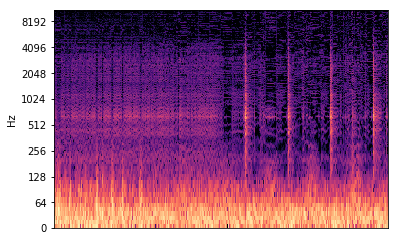

epoch 140/500, loss 0.27152466773986816
epoch 140/500, loss 0.25248241424560547
epoch 140/500, loss 0.2509177029132843
epoch 140/500, loss 0.2662423551082611
epoch 140/500, loss 0.25320741534233093
epoch 140/500, loss 0.26305192708969116
epoch 140/500, loss 0.2620479166507721
epoch 140/500, loss 0.26030096411705017
epoch 140/500, loss 0.24798382818698883
epoch 140/500, loss 0.25969967246055603
epoch 140/500, loss 0.2635651230812073
epoch 140/500, loss 0.2610878348350525
epoch 140/500, loss 0.2660330832004547
epoch 140/500, loss 0.2429509460926056
epoch 140/500, loss 0.2780369818210602
epoch 140/500, loss 0.2430654615163803
epoch 140/500, loss 0.2588440477848053
epoch 140/500, loss 0.26570144295692444
epoch 140/500, loss 0.259290486574173
epoch 140/500, loss 0.26223093271255493
epoch 140/500, loss 0.25129687786102295
epoch 140/500, loss 0.2536907196044922
epoch 140/500, loss 0.2519046366214752
epoch 140/500, loss 0.25995999574661255
epoch 140/500, loss 0.25824883580207825
epoch 140/500,

epoch 146/500, loss 0.25795412063598633
epoch 146/500, loss 0.25920987129211426
epoch 146/500, loss 0.24087373912334442
epoch 146/500, loss 0.26276490092277527
epoch 146/500, loss 0.26160818338394165
epoch 146/500, loss 0.2619996964931488
epoch 146/500, loss 0.24774137139320374
epoch 146/500, loss 0.2616059482097626
epoch 146/500, loss 0.2634618580341339
epoch 146/500, loss 0.25243431329727173
epoch 146/500, loss 0.2538857161998749
epoch 146/500, loss 0.259880393743515
epoch 146/500, loss 0.24474753439426422
epoch 146/500, loss 0.26195648312568665
epoch 146/500, loss 0.26998651027679443
epoch 146/500, loss 0.26119959354400635
epoch 146/500, loss 0.2622080147266388
epoch 146/500, loss 0.26963961124420166
epoch 146/500, loss 0.2618553042411804
epoch 146/500, loss 0.2630304992198944
epoch 146/500, loss 0.25768086314201355
epoch 146/500, loss 0.25639215111732483
epoch 146/500, loss 0.26584362983703613
epoch 146/500, loss 0.2646495997905731
epoch 146/500, loss 0.26570945978164673
epoch 146/

KeyboardInterrupt: 

In [13]:
def ab_inference(encoder, decoder, testset):
  
    encoder.train(False)
    decoder.train(False)

    frames = np.zeros((testset.amount_frames,
                       testset.batch_size, 
                       testset.sequence_length, 
                       testset.feature_size))

    # Repeatedly sample the RNN and get the output.
    for i, input_batch in enumerate(testset.get_next_batch()):
        
        input_batch = to_var(input_batch).float()

        encoder_hidden = encoder.init_hidden()
        encoder_outputs, encoder_hidden = encoder(input_batch, encoder_hidden)

        decoder_input = input_batch
        decoder_hidden = encoder_hidden[:decoder.number_layers]

        decoder_output, decoder_hidden, decoder_attention = \
            decoder(decoder_input, decoder_hidden, encoder_outputs)

        frames[i] = Variable(decoder_output.data).cpu().data.numpy()
    
    encoder.train(True)
    decoder.train(True)
    
    return frames.reshape((batch_size, -1, testset.feature_size))


previous_epoch = -1

for batch_x, batch_y, epoch in dataset.get_next_batch(number_epochs):

    # Evaluate performance.
    if previous_epoch != epoch and epoch % evaluate_every_epoch == 0:

        predicted_batch = ab_inference(encoder, decoder, testset)
        
        for i in range(amount_evaluation_plots):
            predicted_audio = griffin_lim(predicted_batch[i].T, 
                                          n_iter=100, 
                                          window='hann', 
                                          n_fft=fft_size, 
                                          hop_length=hop_length)
            plot_audio(predicted_audio) 
        previous_epoch = epoch
        
    # Convert to GPU variables.
    batch_x, batch_y = to_var(batch_x), to_var(batch_y)

    loss = train(encoder, 
                 decoder, 
                 encoder_optimiser,
                 decoder_optimiser,
                 batch_x, 
                 batch_y,
                 criterion, 
                 clip_threshold)
    print("epoch {}/{}, loss {}".format(epoch, number_epochs, loss))
    
    


/home/eavi/leon/leon/lib/python3.5/site-packages/ipykernel_launcher.py:130: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
/home/eavi/leon/leon/lib/python3.5/site-packages/librosa/util/utils.py:1725: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  if np.issubdtype(x.dtype, float) or np.issubdtype(x.dtype, complex):
/home/eavi/leon/leon/lib/python3.5/site-packages/librosa/display.py:656: FutureWarning: Conversion of the second argument of issubdtype from `complex` to `np.complexfloating` is deprecated. In future, it will be treated as `np.complex128 == np.dtype(complex).type`.
  if np.issubdtype(data.dtype, np.complex):


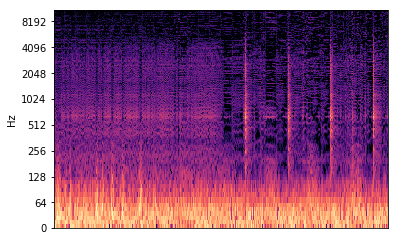

In [15]:
predicted_batch = ab_inference(encoder, decoder, testset)

predicted_audio_a = griffin_lim(predicted_batch[0].T, 
                                n_iter=100, 
                                window='hann', 
                                n_fft=fft_size, 
                                hop_length=hop_length)
plot_audio(predicted_audio_a) 

IPython.display.Audio(predicted_audio_a, rate=dataset.sample_rate)

/home/eavi/leon/leon/lib/python3.5/site-packages/librosa/util/utils.py:1725: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  if np.issubdtype(x.dtype, float) or np.issubdtype(x.dtype, complex):
/home/eavi/leon/leon/lib/python3.5/site-packages/librosa/display.py:656: FutureWarning: Conversion of the second argument of issubdtype from `complex` to `np.complexfloating` is deprecated. In future, it will be treated as `np.complex128 == np.dtype(complex).type`.
  if np.issubdtype(data.dtype, np.complex):


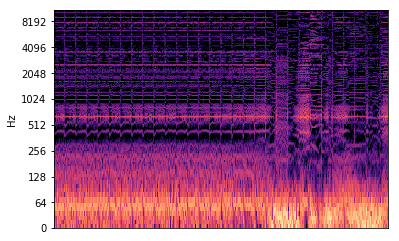

In [17]:
predicted_audio_b = griffin_lim(predicted_batch[1].T, 
                                n_iter=100, 
                                window='hann', 
                                n_fft=fft_size, 
                                hop_length=hop_length)
plot_audio(predicted_audio_b) 

IPython.display.Audio(predicted_audio_b, rate=dataset.sample_rate)

/home/eavi/leon/leon/lib/python3.5/site-packages/librosa/util/utils.py:1725: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  if np.issubdtype(x.dtype, float) or np.issubdtype(x.dtype, complex):
/home/eavi/leon/leon/lib/python3.5/site-packages/librosa/display.py:656: FutureWarning: Conversion of the second argument of issubdtype from `complex` to `np.complexfloating` is deprecated. In future, it will be treated as `np.complex128 == np.dtype(complex).type`.
  if np.issubdtype(data.dtype, np.complex):


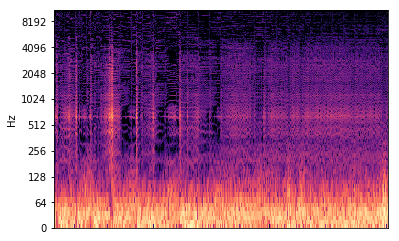

In [18]:
predicted_audio_c = griffin_lim(predicted_batch[2].T, 
                                n_iter=100, 
                                window='hann', 
                                n_fft=fft_size, 
                                hop_length=hop_length)
plot_audio(predicted_audio_c) 

IPython.display.Audio(predicted_audio_c, rate=dataset.sample_rate)

/home/eavi/leon/leon/lib/python3.5/site-packages/librosa/util/utils.py:1725: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  if np.issubdtype(x.dtype, float) or np.issubdtype(x.dtype, complex):
/home/eavi/leon/leon/lib/python3.5/site-packages/librosa/display.py:656: FutureWarning: Conversion of the second argument of issubdtype from `complex` to `np.complexfloating` is deprecated. In future, it will be treated as `np.complex128 == np.dtype(complex).type`.
  if np.issubdtype(data.dtype, np.complex):


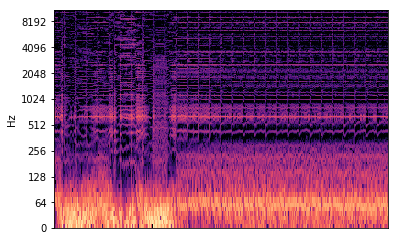

In [19]:
predicted_audio_d = griffin_lim(predicted_batch[3].T, 
                                n_iter=100, 
                                window='hann', 
                                n_fft=fft_size, 
                                hop_length=hop_length)
plot_audio(predicted_audio_d) 

IPython.display.Audio(predicted_audio_d, rate=dataset.sample_rate)